# Data-Driven Cosmology - Neural Networks

## Brief timeline
1943: Warren McCulloch and Walter Pitts publish "A Logical Calculus of the Ideas Immanent in Nervous Activity," laying the groundwork for artificial neural networks by proposing a computational model of the brain.

1957: Frank Rosenblatt introduces the perceptron, a single-layer neural network capable of binary classification.

1959: Bernard Widrow and Marcian Hoff introduce the Widrow-Hoff learning rule (also known as the delta rule or the least mean squares algorithm), a simple method for training perceptrons.

1960s: The perceptron falls out of favor due to its limitations in solving nonlinear problems, highlighted by Marvin Minsky and Seymour Papert in their book "Perceptrons: An Introduction to Computational Geometry."

1970s - 1980s: Interest in neural networks continues under the framework of connectionism, with researchers exploring more complex architectures and learning algorithms. Backpropagation, a powerful algorithm for training multi-layer neural networks, is independently developed and popularised by multiple researchers, including Paul Werbos, David Rumelhart, Geoffrey Hinton, and Ronald J. Williams.

1982: Physicist John Hopfield was able to prove that a form of neural network (now called a "Hopfield net") could learn and process information, and provably converges after enough time under any fixed condition. It was a breakthrough, as it was previously thought that nonlinear networks would, in general, evolve chaotically.

1989: Yann LeCun introduces the Convolutional Neural Network (CNN), a specialized type of neural network architecture particularly well-suited for image processing tasks.

1990s: Despite some advances, neural networks experience a period of reduced interest and funding, known as the "AI Winter," due to limitations in computational power, lack of large datasets, and disappointing performance in certain applications.

2006: Geoffrey Hinton, Yoshua Bengio, and Yann LeCun propose deep learning as a subfield of machine learning focused on learning representations of data through multiple layers of abstraction.

2012: The deep learning community achieves a breakthrough when Alex Krizhevsky and colleagues win the ImageNet Large Scale Visual Recognition Challenge (ILSVRC) using a deep convolutional neural network, known as AlexNet.

2014: Generative Adversarial Networks (GANs), introduced by Ian Goodfellow and colleagues, revolutionize the field of generative modeling by pitting two neural networks against each other to generate realistic synthetic data.

2015: Long Short-Term Memory (LSTM) networks, a type of recurrent neural network architecture designed for sequential data, become widely adopted in natural language processing and other time-series prediction tasks.

2018: OpenAI releases GPT (Generative Pre-trained Transformer), a large-scale language model based on the Transformer architecture, showcasing the capabilities of deep learning in natural language understanding and generation.

Neural networks, particularly deep learning models, have become dominant in various fields, including astronomy, cosmology, astrophysics, computer vision, natural language processing, speech recognition, healthcare, finance, and many others.

Research and development in neural networks continue to advance rapidly, with ongoing efforts to improve architectures, training algorithms, and applications.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Corfu_Lectures/
from IPython.display import Image

Mounted at /content/drive
/content/drive/MyDrive/Corfu_Lectures


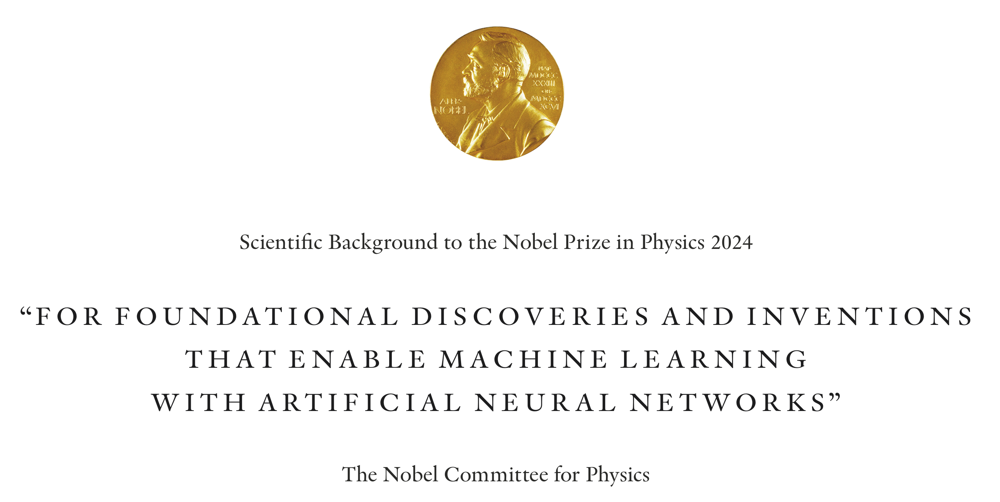

In [ ]:
Image('figures/Nobel_prize_24.png')

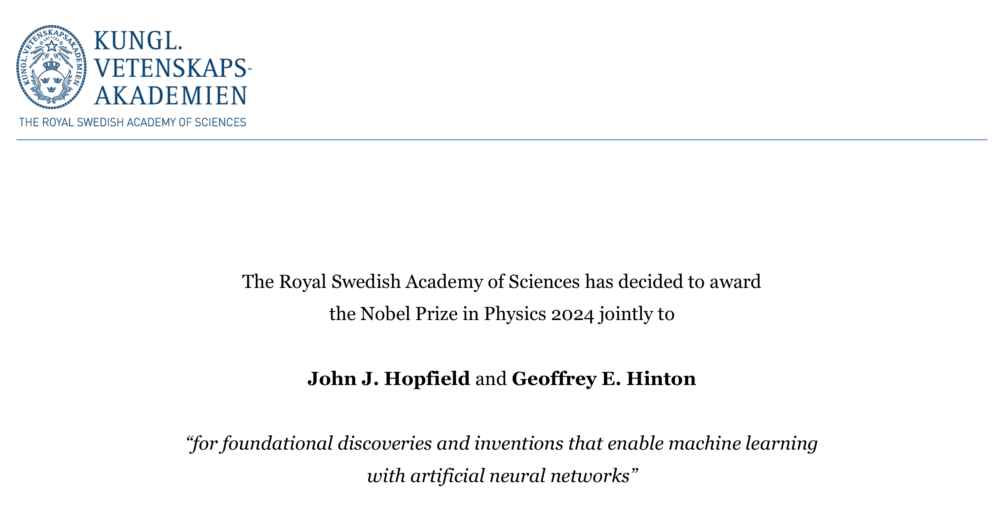

In [ ]:
Image('figures/Nobel_prize_2024.png')

## Birth of Artificial Intelligence

The idea of artificial intelligence was generated by mathematician and computer scientist Alan Mathison Turing in 1950. Alan Turing’s paper called “Computing Machinery and Intelligence” starts with the question “Can machines think?”.

This question is considered to be the birth of artificial intelligence and the beginning of the brief history of AI. He came up with “The Imitation Game” aka “Turing Test” in his paper.

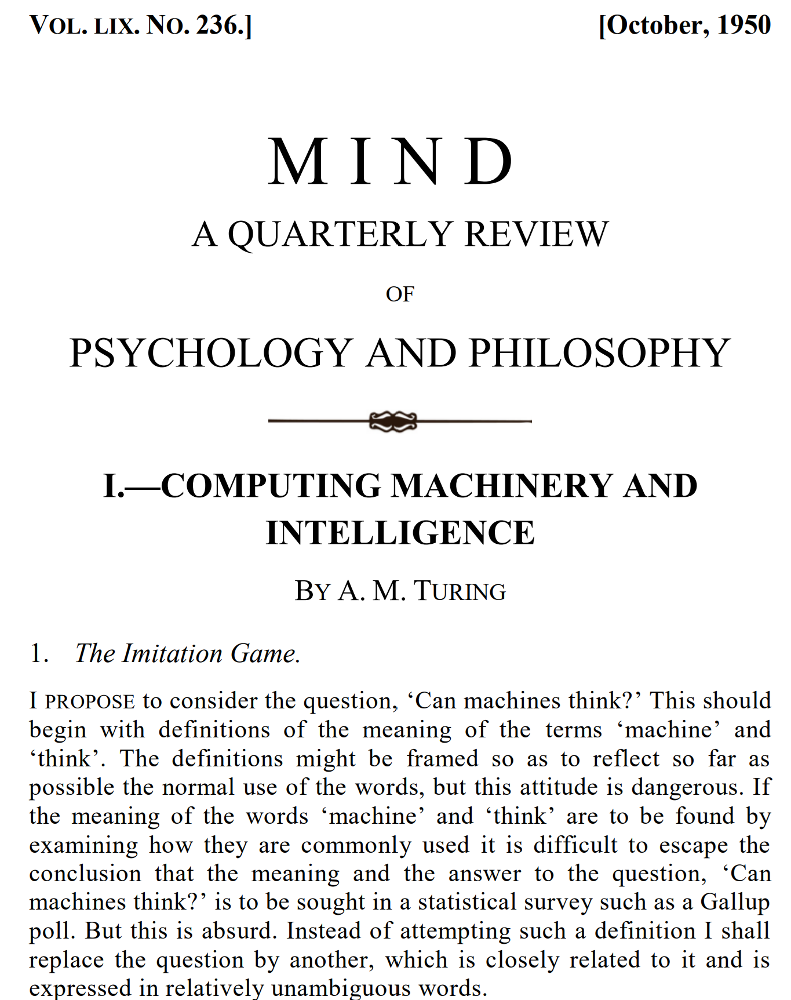

In [ ]:
Image('figures/Turing_paper.png')

#### After the Turing Test, the second significant incident for AI was John McCarthy’s use of the term ‘artificial intelligence’ for the first time. John McCarthy is also called the “father of artificial intelligence”. He specifies AI as "the science and engineering of making intelligent machines."

#### The Dartmouth Summer Research Project on Artificial Intelligence aka Dartmouth Artificial Intelligence Conference which was held in 1956 summer at Dartmouth College is the beginning of the field of artificial intelligence. Scientists who participated in this conference to brainstorm on AI are John McCarthy, Marvin Minsky, Claude Shannon, and Nathan Rochester. This big event led next-generation scientists to be inspired and work on information technologies to ease human life.

## Biological Neurons: An Overly Simplified Illustration

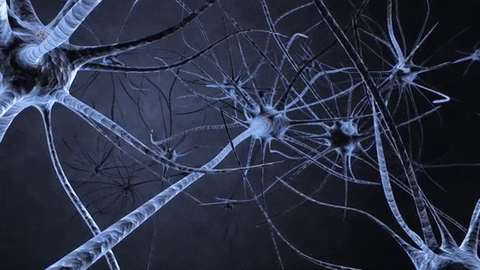

In [ ]:
Image('figures/neuron_gif.gif')

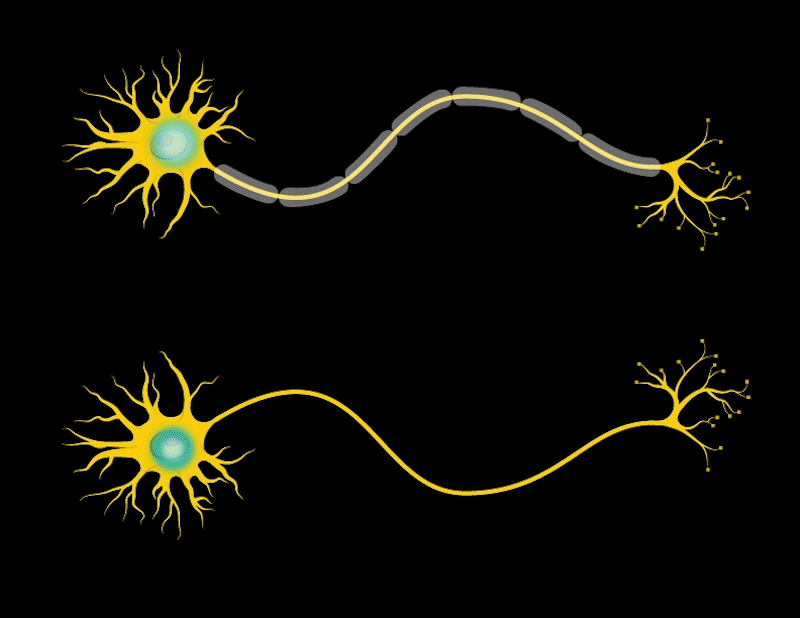

In [ ]:
Image('figures/Neuron-Animation.gif')

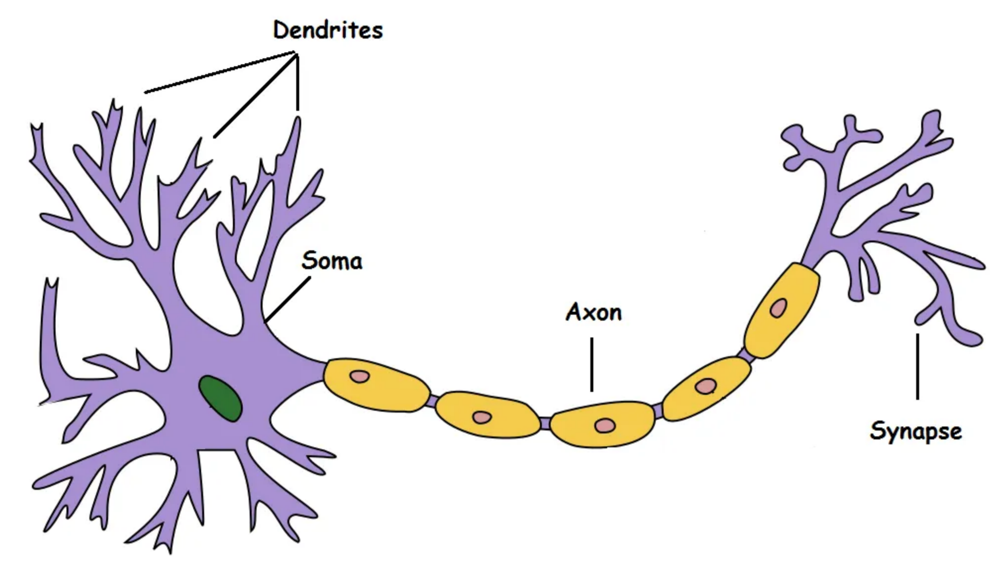

In [ ]:
Image('figures/biological_neuron.png')

#### Dendrite: Receives signals from other neurons
#### Soma: Processes the information
#### Axon: Transmits the output of this neuron
#### Synapse: Point of connection to other neurons

#### Basically, a neuron takes an input signal (dendrite), processes it like the CPU (soma), passes the output through a cable like structure to other connected neurons (axon to synapse to other neuron’s dendrite). Now, this might be biologically inaccurate as there is a lot more going on out there but on a higher level, this is what is going on with a neuron in our brain — takes an input, processes it, throws out an output.

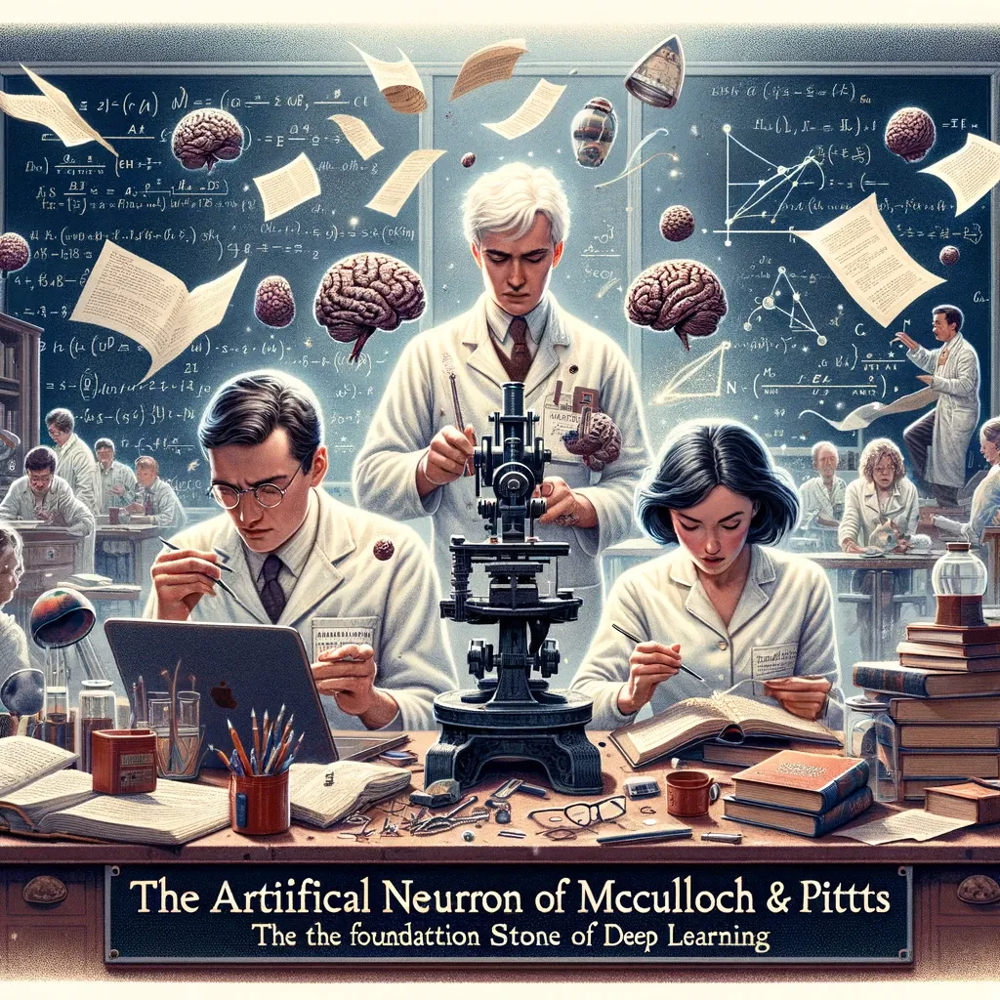

In [ ]:
Image('figures/Mcculloch_Pitts.png')

https://medium.com/@glennlenormand/the-artificial-neuron-of-mcculloch-and-pitts-the-foundation-stone-of-deep-learning-9040d9ae5512

## McCulloch-Pitts neuron

#### The McCulloch-Pitts neuron was a binary device, functioning in an all-or-nothing manner.
#### It had multiple inputs and one output; if the combined inputs exceeded a certain threshold, the neuron would ‘fire’, otherwise, it remained inactive. This simple yet powerful concept mimicked the basic function of neurons in the brain.
#### It has only two types of inputs — Excitatory and Inhibitory.
#### The excitatory inputs have weights of positive magnitude and the inhibitory weights have weights of negative magnitude.
#### The inputs of the McCulloch-Pitts neuron could be either 0 or 1.
#### It has a threshold function as an activation function. So, the output signal $y_{out}$ is 1 if the input $y_{sum}$ is greater than or equal to a given threshold value, else 0.

$$y_{sum}=\sum^n_{i=1}w_ix_i$$
$$y_{out}=
\begin{cases}
    1,& x\geq 1\\
    0,& x<1
\end{cases}
$$



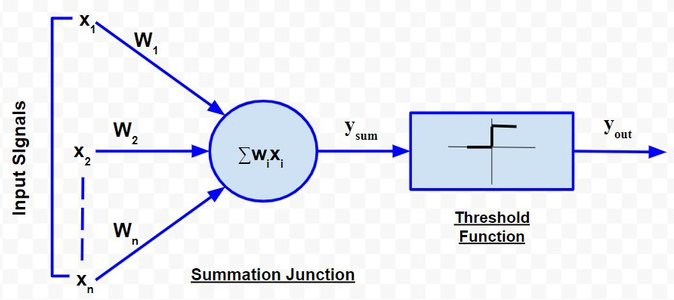

In [ ]:
Image('figures/mcculloh_pits.png')

In [ ]:
# Implementation of McCulloch-Pitts neuron in tensorflow
import tensorflow as tf

def mcculloh_pits_neuron(inputs, weights, threshold):
    weighted_sum = tf.reduce_sum(tf.multiply(inputs, weights))
    output = tf.cond(weighted_sum >= threshold, lambda:1.0, lambda:0.0)
    return output

# input signal
inputs = tf.constant([1, 1, 0], dtype=tf.float32)
# associated weights
weights = tf.constant([-0.2, -0.2, 0.6], dtype=tf.float32)
# threshold for the activation function
threshold = tf.constant(0, dtype=tf.float32)
# output from the neuron
output = mcculloh_pits_neuron(inputs, weights, threshold)
print("output",output)

output 0.0


### Exercise: Apply this neuron to other Boolean combinations

## The Perceptron

#### First introduced by Rosenblatt in 1958 (https://psycnet.apa.org/doi/10.1037/h0042519), "The Perceptron: A Probabilistic Model for Information Storage and Organization in the Brain" is arguably the oldest and most simple of the ANN algorithms. This paper alone is hugely responsible for the popularity and utility of neural networks today.
#### The perceptron model is based on the idea that data points can be separated into two classes by a linear boundary.
#### It works by learning the weights of the input features and using them to make predictions. The weights are learned through a process called training, in which the model is presented with a series of input-output pairs and adjusts the weights based on the error between the predicted output and the true output.

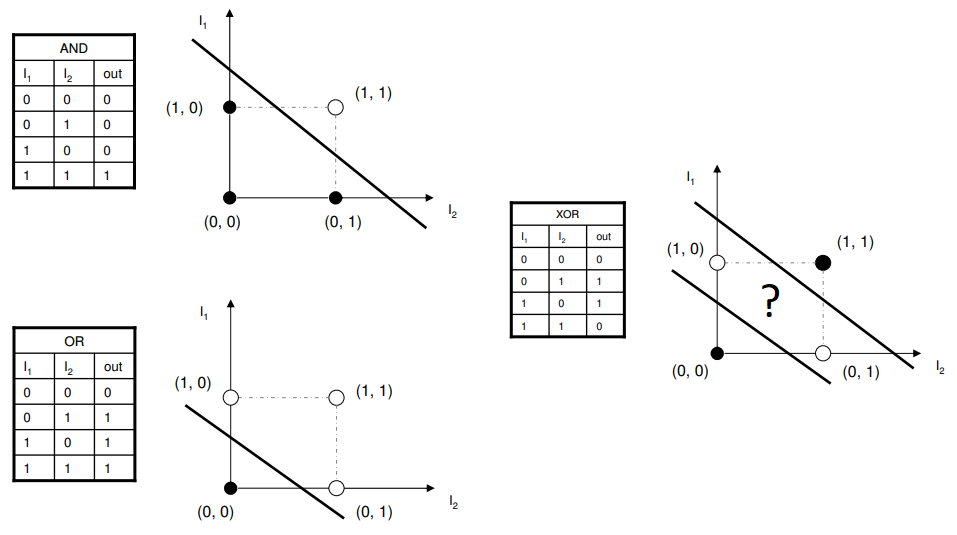

In [ ]:
Image('figures/xor_1.png')

#### We can view the perceptron as representing a hyperplane decision surface in the $n$-dimensional space of instances. Indeed, a perceptron is essentially a method of separating a manifold with a hyperplane.
#### The perceptron outputs a 1 for instances lying on one side of the hyperplane and outputs a 0 for instances lying on the other side.
#### The equation for this decision hyperplane is $$\vec{w}.\vec{x}=0$$
#### Of course, some sets of positive and negative examples cannot be separated by any hyperplane. Those that can be separated are called linearly separable sets.
#### A single perceptron can only be used to implement linearly separable functions. It takes both real and boolean inputs and associates a set of weights to them, along with a bias. We learn the weights, we get the function.


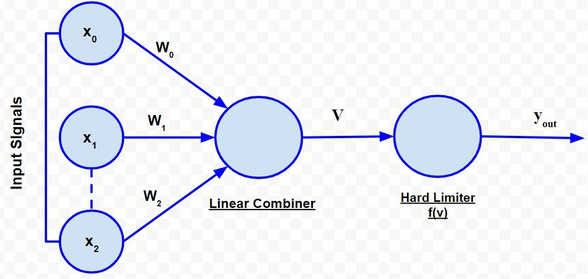

In [ ]:
Image('figures/perceptron.png')

#### Perceptrons can represent all of the primitive boolean functions AND, OR,  NAND, and NOR.
#### Unfortunately, however, some boolean functions cannot be represented by a single perceptron, such as the XOR function.
## The Perceptron Training Rule
#### One way to learn an acceptable weight vector is to begin with random  weights, then iteratively apply the perceptron to each training example, modifying the perceptron weights whenever it misclassifies an example. This process is  repeated, iterating through the training examples as many times as needed until the perceptron classifies all training examples correctly. Weights are modified at each step according to the perceptron training rule, which revises the weight $w_i$ associated with input $x_i$ according to the rule
$$w_i\rightarrow w_i+\Delta w_i$$
#### where
$$\Delta w_i=\eta(t-o)x_i$$
#### Here $t$ is the target output for the current training example, $o$ is the output generated by the perceptron, and $\eta$ is a positive constant called the learning rate. The role of the learning rate is to moderate the degree to which weights are changed at each step. It is usually set to some small value (ex. 0.1) and is sometimes made to decay as the number of weight-tuning iterations increases.
#### This learning procedure can be proven to converge within a finite number of applications of the perceptron training rule to a weight vector that correctly classifies all training examples, provided the training examples are linearly separable and provided a sufficiently small $\eta$ is used (Minsky and Papert 1969). If the data are not linearly separable, convergence is not assured.


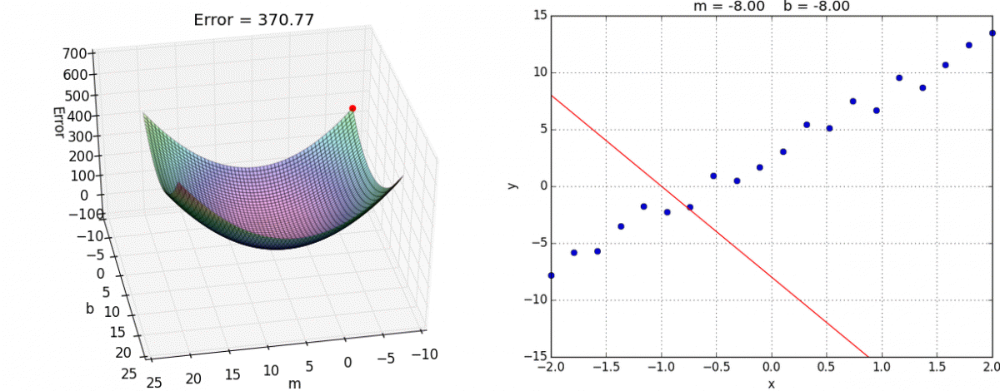

In [ ]:
Image('figures/flashlight_local_search.gif')
Image('figures/gradient_descent_line_graph.gif')

#### Our judgment about model goodness is an intuition manufactured in your brain. Algorithms don’t have access to your intuitions. We need a loss function that translates intuitions into numbers.
#### Considering regression, the larger the residuals, the worse the model. This also applies to the loss function of a neural network.


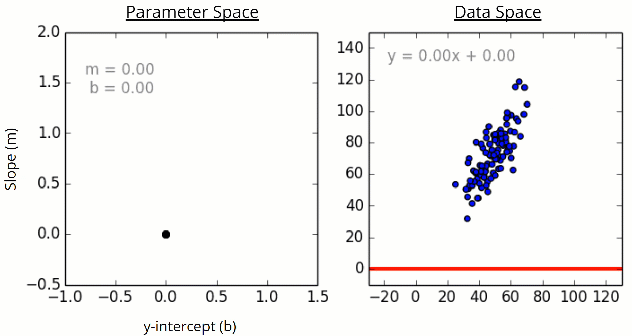

In [ ]:
Image('figures/dualspace_loss-2.gif')
Image('figures/dualspace_explore.gif')

#### Consider a perceptron for the XOR AND OR

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
def xor(x1, x2):
    """returns XOR"""
    return bool(x1) != bool(x2)

x     = np.array([[0,0],[0,1],[1,0],[1,1]])
y_XOR = np.array([xor(*x) for x in x])

def OR(x1, x2):
    """returns OR"""
    return (bool(x1) or bool(x2))

x    = np.array([[0,0],[0,1],[1,0],[1,1]])
y_OR = np.array([OR(*x) for x in x])

def AND(x1, x2):
    """returns AND"""
    return (bool(x1) and bool(x2))

x     = np.array([[0,0],[0,1],[1,0],[1,1]])
y_AND = np.array([AND(*x) for x in x])

#### The shown decision boundaries have been inferred from the hyperplane equation $$\sum_{i=0}^n w_i x_i=0$$ $$w_0x_0+w_1x_1+w_2x_2=0$$

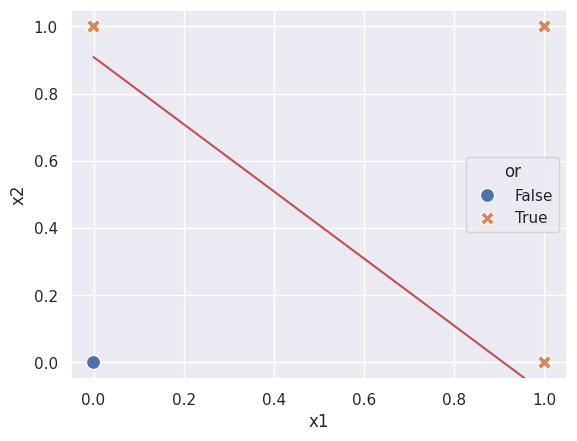

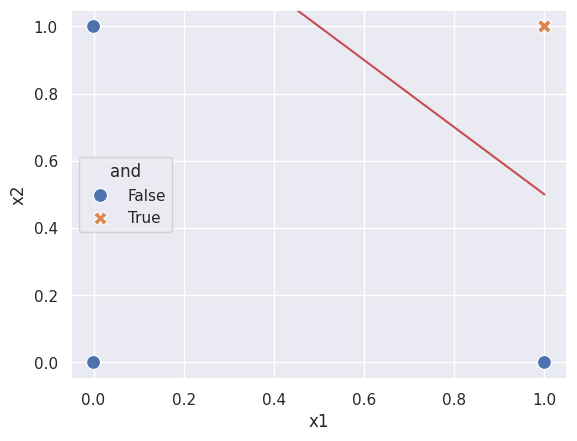

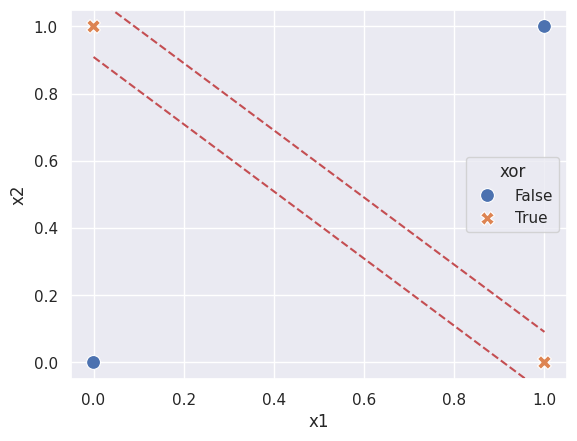

In [ ]:
sns.set()

data = pd.DataFrame(x, columns=['x1', 'x2'])
data['xor'] = y_XOR
data['or']  = y_OR
data['and'] = y_AND
sns.scatterplot(data=data, x='x1', y='x2', style='or', hue='or', s=100)
x_sol = np.linspace(0, 1, num=2)
plt.plot(-x_sol + 1/1.1, 'r')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.figure()
sns.scatterplot(data=data, x='x1', y='x2', style='and', hue='and', s=100)
x_sol = np.linspace(0, 1, num=2)
plt.plot(-x_sol  + 1.5, 'r')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.figure()
sns.scatterplot(data=data, x='x1', y='x2', style='xor', hue='xor', s=100)
x_sol = np.linspace(0, 1, num=2)
plt.plot(-x_sol + 1/1.1, 'r--')
plt.plot(-x_sol + 1.2/1.1, 'r--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.show()

#### Specify the logical operators

In [ ]:
T = 1
F = 0

# creating data for logical OR operation
def get_OR_data():
    X = [
        [F, F],
        [F, T],
        [T, F],
        [T, T]
        ]
    Y = [
        [F],
        [T],
        [T],
        [T]
        ]
    return X, Y

# creating data for logical AND operation
def get_AND_data():
    X = [
        [F, F],
        [F, T],
        [T, F],
        [T, T]
        ]
    Y = [
        [F],
        [F],
        [F],
        [T]
        ]
    return X, Y

# creating data for logical NOR operation
def get_NOR_data():
    X = [
        [F, F],
        [F, T],
        [T, F],
        [T, T]
        ]
    Y = [
        [T],
        [F],
        [F],
        [F]
        ]
    return X, Y

# creating data for logical XOR operation
def get_XOR_data():
    X = [
        [F, F],
        [F, T],
        [T, F],
        [T, T]
        ]
    Y = [
        [F],
        [T],
        [T],
        [F]
        ]
    return X, Y

#### Define the Perceptron class

In [ ]:
class MyPerceptron:
    def __init__(self, learning_rate=0.8, n_epochs=10, input_weights=[-1, -1], val_bias=1, wt_bias=-1):
        self.lr          = learning_rate
        self.epochs      = n_epochs
        self.weights     = np.array(input_weights)
        self.bias        = val_bias
        self.bias_weight = wt_bias

    # unit step activation function
    def Step_active_func(self, activation):
        if (activation >= 0):
            return 1
        else:
            return 0

    def fit(self, X, Y):
        # count the number of epochs
        epoch_ct = 1
        # training the model on X_train and Y_train
        for epoch in range(self.epochs):
            print('Epoch {}'.format(epoch_ct))
            print('Y_pred', '\t', 'e', '\t', 'weights', '\t', 'bias_weight')
            for i in range(X.shape[0]):
                # compute the activation function
                Y_pred = self.Step_active_func(np.dot(self.weights, X[i]) + self.bias*self.bias_weight)
                # compute the loss function -> mean absolute error
                mae = Y[i] - Y_pred
                # updating the weights using the optimisation algorithm
                self.weights = self.weights + self.lr*mae*X[i]
                # update the bias weight
                self.bias_weight = self.bias_weight + self.lr*mae*self.bias
                print(Y_pred, '\t', mae, '\t', self.weights, '\t', self.bias_weight)
            epoch_ct += 1

In [ ]:
# specify the logical operation
X, Y = get_OR_data()

print('X =', X, '\n', 'Y =', Y)

X = [[0, 0], [0, 1], [1, 0], [1, 1]] 
 Y = [[0], [1], [1], [1]]


In [ ]:
clf = MyPerceptron(learning_rate=0.8, n_epochs=10, input_weights=[-1, -1], val_bias=1, wt_bias=-1)

In [ ]:
clf.fit(np.array(X), np.array(Y))

Epoch 1
Y_pred 	 e 	 weights 	 bias_weight
0 	 [0] 	 [-1. -1.] 	 [-1.]
0 	 [1] 	 [-1.  -0.2] 	 [-0.2]
0 	 [1] 	 [-0.2 -0.2] 	 [0.6]
1 	 [0] 	 [-0.2 -0.2] 	 [0.6]
Epoch 2
Y_pred 	 e 	 weights 	 bias_weight
1 	 [-1] 	 [-0.2 -0.2] 	 [-0.2]
0 	 [1] 	 [-0.2  0.6] 	 [0.6]
1 	 [0] 	 [-0.2  0.6] 	 [0.6]
1 	 [0] 	 [-0.2  0.6] 	 [0.6]
Epoch 3
Y_pred 	 e 	 weights 	 bias_weight
1 	 [-1] 	 [-0.2  0.6] 	 [-0.2]
1 	 [0] 	 [-0.2  0.6] 	 [-0.2]
0 	 [1] 	 [0.6 0.6] 	 [0.6]
1 	 [0] 	 [0.6 0.6] 	 [0.6]
Epoch 4
Y_pred 	 e 	 weights 	 bias_weight
1 	 [-1] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
Epoch 5
Y_pred 	 e 	 weights 	 bias_weight
0 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
Epoch 6
Y_pred 	 e 	 weights 	 bias_weight
0 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
1 	 [0] 	 [0.6 0.6] 	 [-0.2]
Epoch 7
Y_pred 	 e 	 weights 	 bi

## Graphical solution

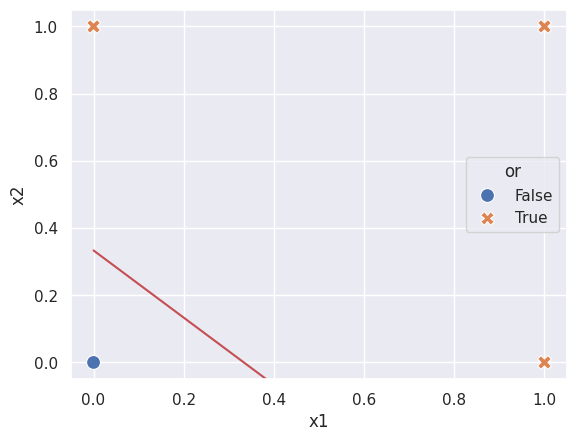

In [ ]:
plt.figure()
sns.scatterplot(data=data, x='x1', y='x2', style='or', hue='or', s=100)

# infer the final weights after training
w1, w2 = clf.weights
w0     = clf.bias_weight[0]

# decision boundary equation coefficients - y = ax + b
a, b = -w1/w2, -w0/w2
#
x = np.linspace(0, 1, num=2)
plt.plot(a*x + b, 'r')
#
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.show()

#### Exercise: Adopt a similar implementation with an AND

## Implementation in PyTorch
https://pytorch.org/docs/stable/nn.functional.html#loss-functions

In [ ]:
import torch

class Perceptron(torch.nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.linear = torch.nn.Linear(input_dim, 1)

    def forward(self, x):
        return torch.sigmoid(self.linear(x))

#### The forward method is used to define the forward pass of the model.
#### We are using a sigmoid activation function to map the output of the linear layer to a probability between 0 and 1.
#### We will define the training loop for the perceptron model. In the training loop, we will iterate over a series of input-output pairs and use them to update the weights of the model. The stochastic gradient descent (SGD) optimizer is being used to update the weights of the model.
#### We are also using the binary cross-entropy loss function to measure the error between the predicted output and the true output. The loss function is used to calculate the gradient of the loss with respect to the model’s weights, which is then used to update the weights using the optimizer.

In [ ]:
def train(model, train_inputs, train_labels, epochs=100, learning_rate=0.001):
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    criterion = torch.nn.BCEWithLogitsLoss()

    for epoch in range(epochs):
        optimizer.zero_grad()
        output = model(train_inputs)
        loss = criterion(output, train_labels)
        loss.backward()
        optimizer.step()

#### Here we return the accuracy of the model as the ratio of correct predictions to the total number of test samples.

In [ ]:
def test(model, test_inputs, test_labels):
    output = model(test_inputs)
    correct = 0
    for i in range(len(test_labels)):
        if output[i] > 0.5:
            prediction = 1
        else:
            prediction = 0
        if prediction == test_labels[i]:
            correct += 1
    return correct / len(test_labels)

#### Consider the OR logical operator

In [ ]:
# Define the input and output data
X = torch.Tensor([[0, 0], [0, 1], [1, 0], [1, 1]])
y = torch.Tensor([[0], [1], [1], [1]])

# Create an instance of the Perceptron class
model = Perceptron(2)

# Train the model
train(model, X, y, epochs=50, learning_rate=0.8)

# Test the model
accuracy = test(model, X, y)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 1.00


## Activation functions

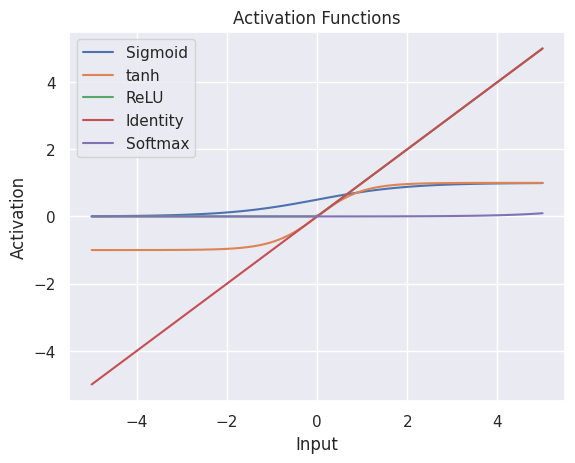

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-5, 5, 100)
plt.plot(x, 1 / (1 + np.exp(-x)), label='Sigmoid')
plt.plot(x, np.tanh(x), label='tanh')
plt.plot(x, np.maximum(0, x), label='ReLU')
plt.plot(x, x, label='Identity')
plt.plot(x, np.exp(x) / np.sum(np.exp(x)), label='Softmax')

plt.xlabel('Input')
plt.ylabel('Activation')
plt.title('Activation Functions')
plt.legend()
plt.grid(True)
plt.show()

## Classification of Sloan Digital Sky Survey DR14 astronomical objects via the perceptron

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# import the data
data_dr14 = pd.read_csv('data/SDSS_DR14_reduced.csv')
data_dr14.head()

,ra,dec,redshift,class
0,183.531326,0.089693,-0.000009,STAR
1,183.598370,0.135285,-0.000055,STAR
2,183.680207,0.126185,0.123111,GALAXY
3,183.870529,0.049911,-0.000111,STAR
4,183.883288,0.102557,0.000590,STAR


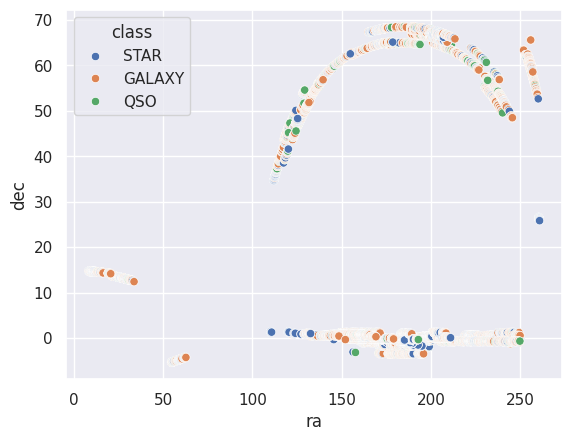

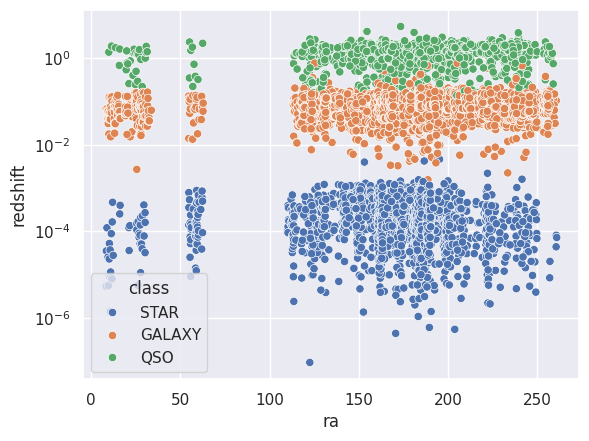

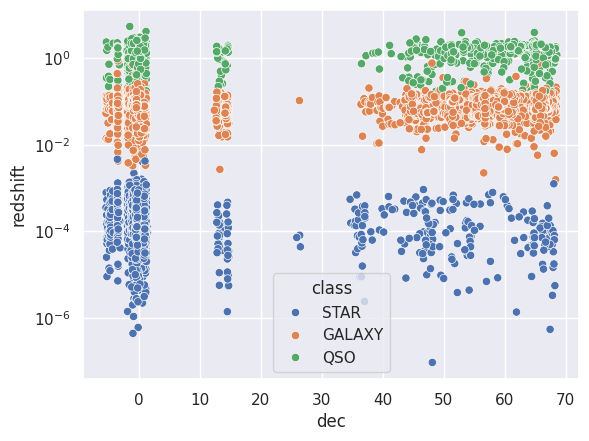

In [ ]:
# scatter plot of all the SDSS data in different projections
sns.scatterplot(x="ra", y="dec", data=data_dr14, hue="class")
plt.figure()
sns.scatterplot(x="ra", y="redshift", data=data_dr14, hue="class")
plt.yscale('log')
plt.figure()
sns.scatterplot(x="dec", y="redshift", data=data_dr14, hue="class")
plt.yscale('log')
plt.show()

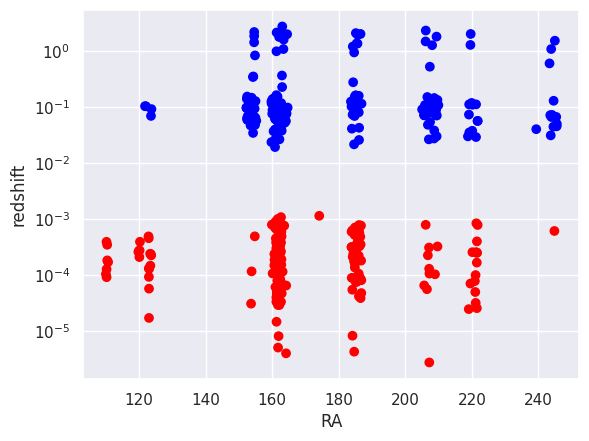

In [ ]:
# extract the objects' class, i.e. GALAXY, QSO, STAR
y = data_dr14.iloc[:, 3].values
#
# change the objects' class to -1 if its a STAR, otherwise to 1
y = np.where(y == 'STAR', -1, 1)
#
# extract RA and redshift of the objects
X = data_dr14.iloc[:, [0, 2]].values
#
# select a subset from 10000 objects
y = y[:500]
X = X[:500, :]
#
# data visualisation according to the objects' class
# - red if its a STAR, blue otherwise
color = ['red' if l == -1 else 'blue' for l in y]
#
plt.scatter(X[:, 0], X[:, 1], marker='o', color=color)
plt.yscale('log')
#
plt.xlabel('RA')
plt.ylabel('redshift')
plt.show()

#### Apply the perceptron

In [ ]:
class Perceptron:
    def __init__(self, lr = 0.01, threshold = 0, n_epochs = 10):
        self.learn_rate = lr
        self.threshold = threshold
        self.n_epochs = n_epochs

    def fit(self, X, y):
        N = X.shape[0]

        X = np.concatenate((np.ones([N,1]), X), axis = 1)

        m = X.shape[1]

        # initialise the weights
        self.w_ = np.zeros([m, 1])
        # initialise the errors - loss function
        self.errors_ = []

        for _ in range(self.n_epochs):
            errors = 0

            for x_n, y_n in zip(X, y):
                x_n = x_n.reshape((m, 1))
                # updating the weights using the optimisation algorithm
                update = self.learn_rate*(y_n - self.active_func(x_n))*x_n
                self.w_ += update
                # update the loss function
                errors += np.sum(update != 0.0)/(m)

            self.errors_.append(errors)


    def active_func(self, x):
            """ Activation function"""
            return np.where(np.dot(self.w_.T, x) >= self.threshold, 1, -1)

In [ ]:
# initialise parameters for the Perceptron
perceptron = Perceptron(lr = 0.1, n_epochs = 100)
# learn the weights
perceptron.fit(X, y)

<ipython-input-28-746754bfe8f5>:5: RuntimeWarning: divide by zero encountered in log
  plt.scatter(X[:, 0], np.log(X[:, 1]), marker = 'o', color = color)
<ipython-input-28-746754bfe8f5>:5: RuntimeWarning: invalid value encountered in log
  plt.scatter(X[:, 0], np.log(X[:, 1]), marker = 'o', color = color)


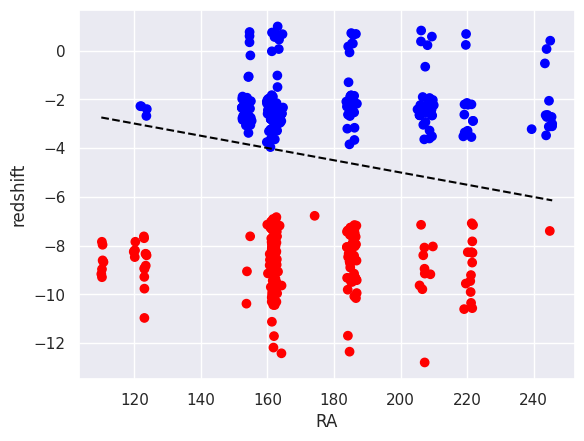

In [ ]:
# Plot the inferred decision boundary via the perceptron
# data visualisation
color = ['red' if l == -1 else 'blue' for l in y]

plt.scatter(X[:, 0], np.log(X[:, 1]), marker = 'o', color = color)
#
plt.xlabel('RA')
plt.ylabel('redshift')
#
# visualise the decision boundary line
xx = np.linspace(min(X[:, 0]), max(X[:, 0]))
# infer the weights
w = perceptron.w_
# infer the gradient and y-intercept of the decision boundary
a = -w[0]/w[2]
b = -w[1]/w[2]
# equation for the decision boundary
yy = a + b*xx
# plot the decision boundary
plt.plot(xx, yy, '--', color = 'black')
plt.show()

##### Exercise: Infer the decision boundary between the STAR class of objects and GALAXY/QSO when considering the DEC vs redshift projection of data

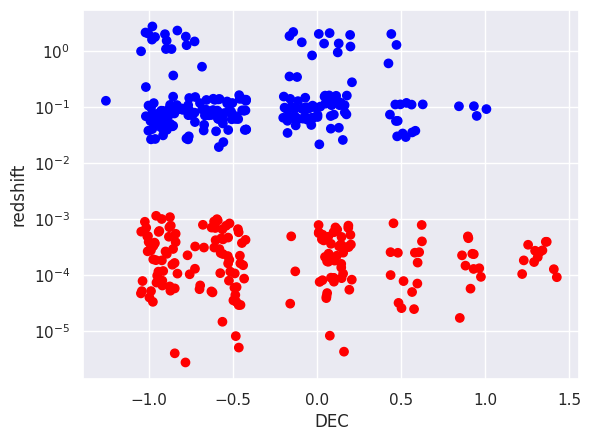

In [ ]:
# extract the objects' class, i.e. GALAXY, QSO, STAR
y = data_dr14.iloc[:, 3].values
#
# change the objects' class to -1 if its a STAR, otherwise to 1
y = np.where(y == 'STAR', -1, 1)
#
# extract DEC and redshift of the objects
X = data_dr14.iloc[:, [1, 2]].values
#
# select a subset from 10000 objects
y = y[:500]
X = X[:500, :]
#
# data visualisation according to the objects' class
# - red if its a STAR, blue otherwise
color = ['red' if l == -1 else 'blue' for l in y]
#
plt.scatter(X[:, 0], X[:, 1], marker='o', color=color)
plt.yscale('log')
#
plt.xlabel('DEC')
plt.ylabel('redshift')
plt.show()

In [ ]:
# initialise parameters for the Perceptron
perceptron = Perceptron(lr = 0.8, n_epochs = 1000)
# learn the weights
perceptron.fit(X, y)

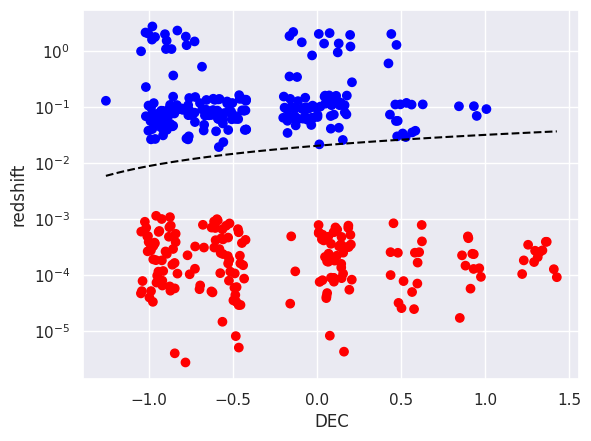

In [ ]:
# Plot the inferred decision boundary via the perceptron
# data visualisation
color = ['red' if l == -1 else 'blue' for l in y]

plt.scatter(X[:, 0], X[:, 1], marker = 'o', color = color)
#
plt.xlabel('DEC')
plt.ylabel('redshift')
#
# visualise the decision boundary line
xx = np.linspace(min(X[:, 0]), max(X[:, 0]))
# infer the weights
w = perceptron.w_
# infer the gradient and y-intercept of the decision boundary
a = -w[0]/w[2]
b = -w[1]/w[2]
# equation for the decision boundary
yy = a + b*xx
# plot the decision boundary
plt.plot(xx, yy, '--', color = 'black')
plt.yscale('log')
plt.show()